In [1]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
from numba import cuda, jit, int32, int64
import math 
import time 

In [2]:
def CPU_bilateral(img, blur, d):
  result = []

  for i in img:
    result.append(np.zeros(len(img[0])))
    
  for x in range(d, img.shape[0] - d):
    for y in range(d, img.shape[1] - d):
      sum = 0
      counter = 0
      for i in range(x - d, x + d):
        for j in range(y - d, y + d):
          if abs(img[x][y] - img[i][j]) < blur:
            sum += img[i][j]
            counter += 1
          
      res = sum / counter
      result[x][y] = int(res)

  for x in range(d):
    for h in range(len(img)):
      result[h][x] = img[h][x]
      result[h][-x - 1] = img[h][-x - 1]

    for w in range(len(img[0])):
      result[x][w] = img[x][w]
      result[-x - 1][w] = img[-x - 1][w]

  return result

In [3]:
def perform_GPU(img, blur, d):
  result = []
  for i in img:
    result.append(np.zeros(len(img[0])))
  
  buffer = [blur, d]

  img_copied = cuda.to_device(img)
  result_copied = cuda.to_device(result)
  buffer_copied = cuda.to_device(buffer)

  threads_in_block = (32, 32)
  blocks_in_grid = (math.ceil(img.shape[0] / threads_in_block[0]), math.ceil(img.shape[1] / threads_in_block[1]))

  GPU_bilateral[blocks_in_grid, threads_in_block](img_copied, result_copied, buffer_copied)

  result_from_GPU = result_copied.copy_to_host()
  
  for x in range(d):
    for h in range(len(img)):
      result_from_GPU[h][x] = img[h][x]
      result_from_GPU[h][-x - 1] = img[h][-x - 1]

    for w in range(len(img[0])):
      result_from_GPU[x][w] = img[x][w]
      result_from_GPU[-x - 1][w] = img[-x - 1][w]
  
  return result_from_GPU

In [4]:
@cuda.jit
def GPU_bilateral(img, result, buffer):
  idx = cuda.blockIdx.x * cuda.blockDim.x + cuda.threadIdx.x
  jdx = cuda.blockIdx.y * cuda.blockDim.y + cuda.threadIdx.y

  if idx < (img.shape[0]) - (buffer[1] * 2):
    if (jdx < img.shape[1]) - (buffer[1] * 2):
      x = idx + buffer[1]
      y = jdx + buffer[1]
      sum = 0
      counter = 0

      for i in range(x - buffer[1], x + buffer[1]):
        for j in range(y - buffer[1], y + buffer[1]): 
          
          if abs(img[x][y] - img[i][j]) < buffer[0]:
            sum += img[i][j]
            counter += 1

      result[x][y] = sum / counter

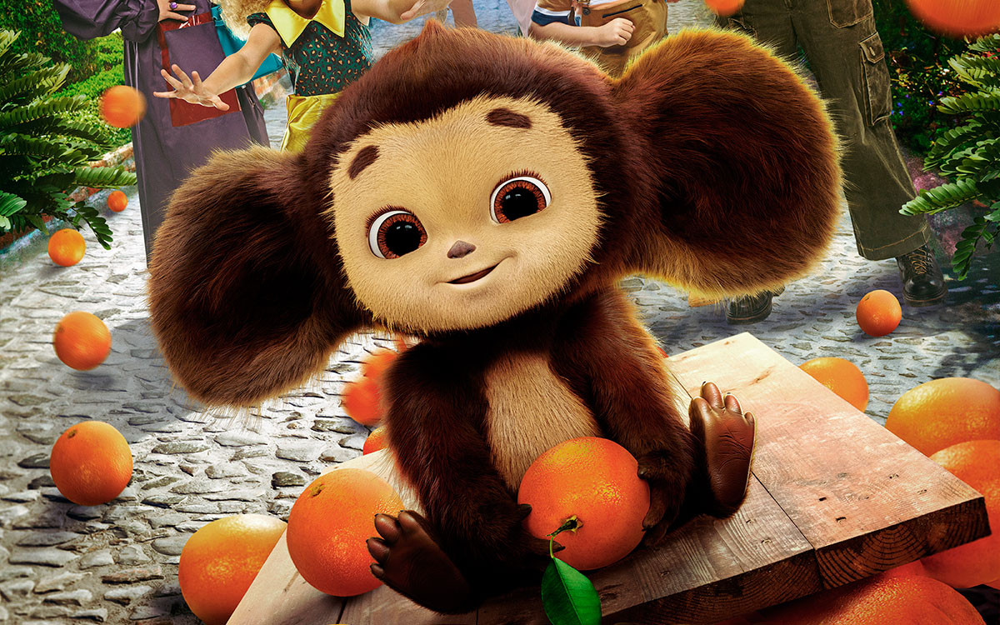

In [11]:
img_orig = cv2.imread("/content/image.jpg")
cv2_imshow(img_orig)

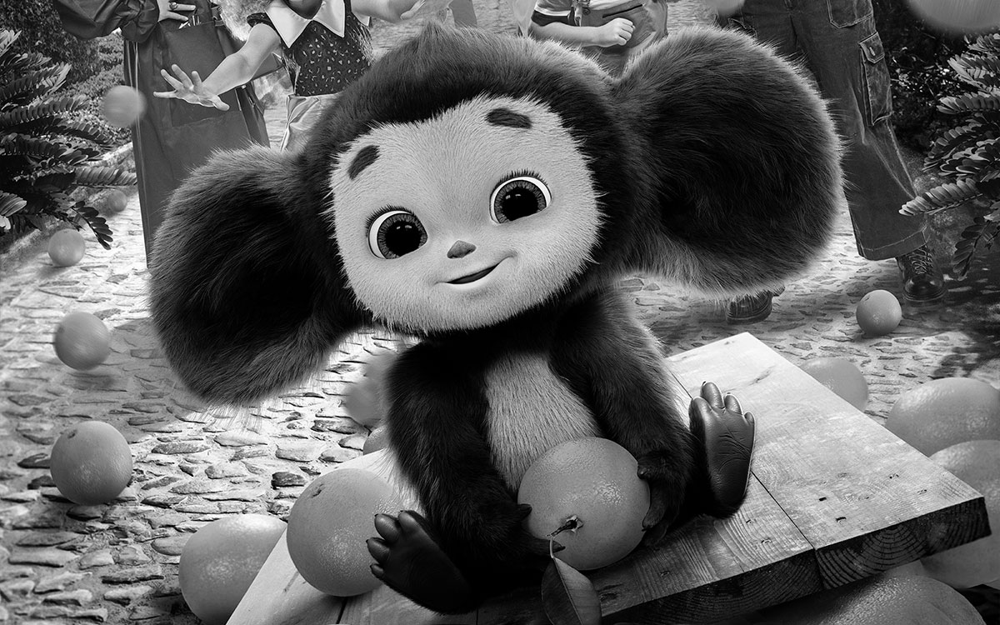

In [12]:
img = cv2.imread("/content/image.jpg", cv2.IMREAD_GRAYSCALE)
cv2_imshow(img)

CPU processing with parameters: 
blur =  10 
d =  1


<ipython-input-2-5cac72cea1a1>:13: RuntimeWarning: overflow encountered in ubyte_scalars
  if abs(img[x][y] - img[i][j]) < blur:


Processed image from CPU:



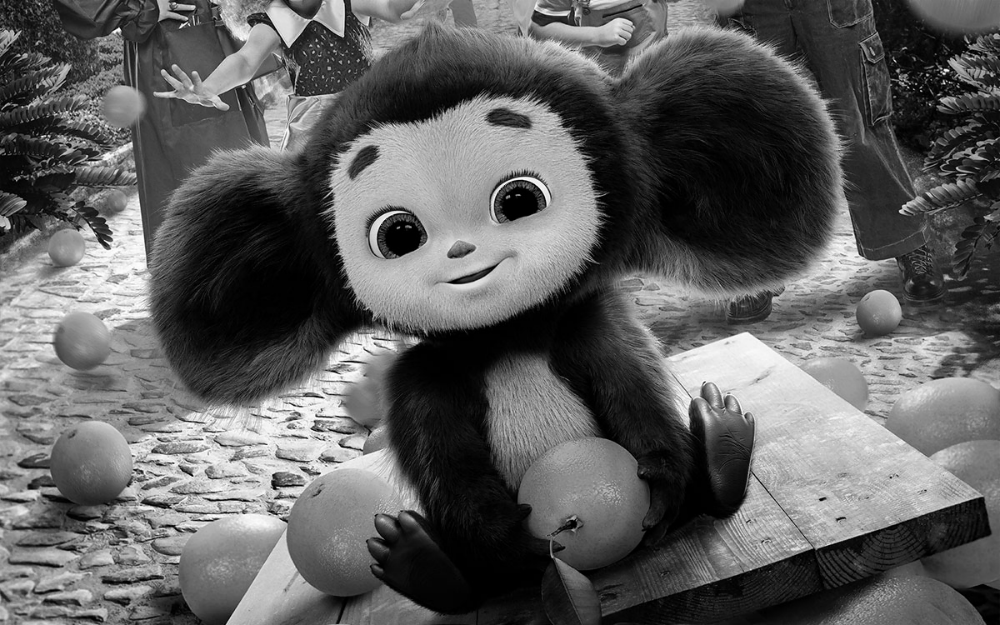

GPU processing with parameters: 
blur =  10 
d =  1
Processed image from GPU:



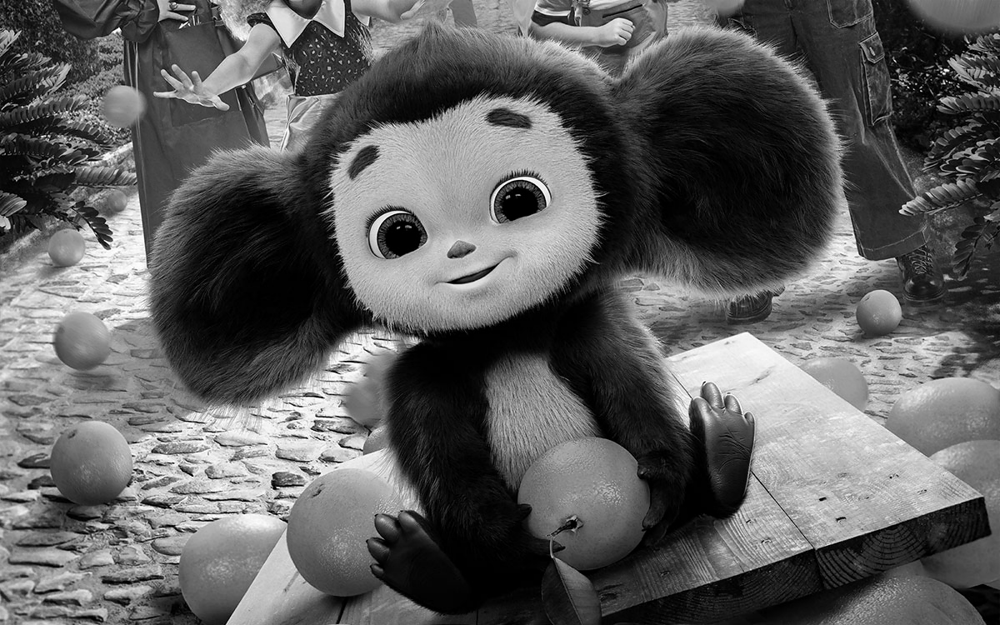


******************************************************************************************
Total time CPU:  14.030925273895264
Total time GPU:  1.9430418014526367
Acceleration (blur =  10 d =  1 ):  7.2211134435736835
******************************************************************************************

CPU processing with parameters: 
blur =  10 
d =  2


<ipython-input-2-5cac72cea1a1>:13: RuntimeWarning: overflow encountered in ubyte_scalars
  if abs(img[x][y] - img[i][j]) < blur:


Processed image from CPU:



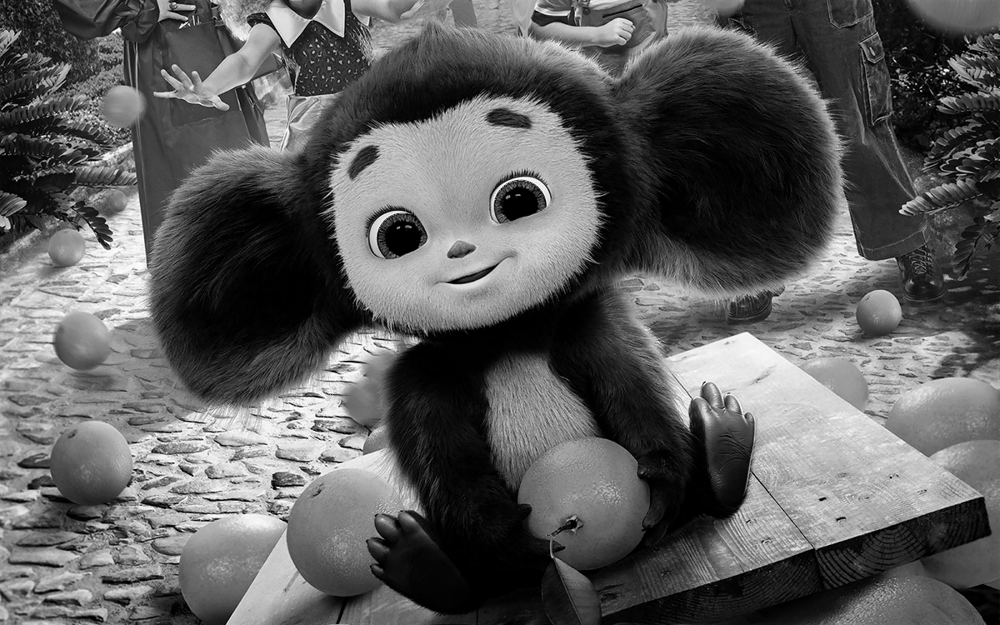

GPU processing with parameters: 
blur =  10 
d =  2
Processed image from GPU:



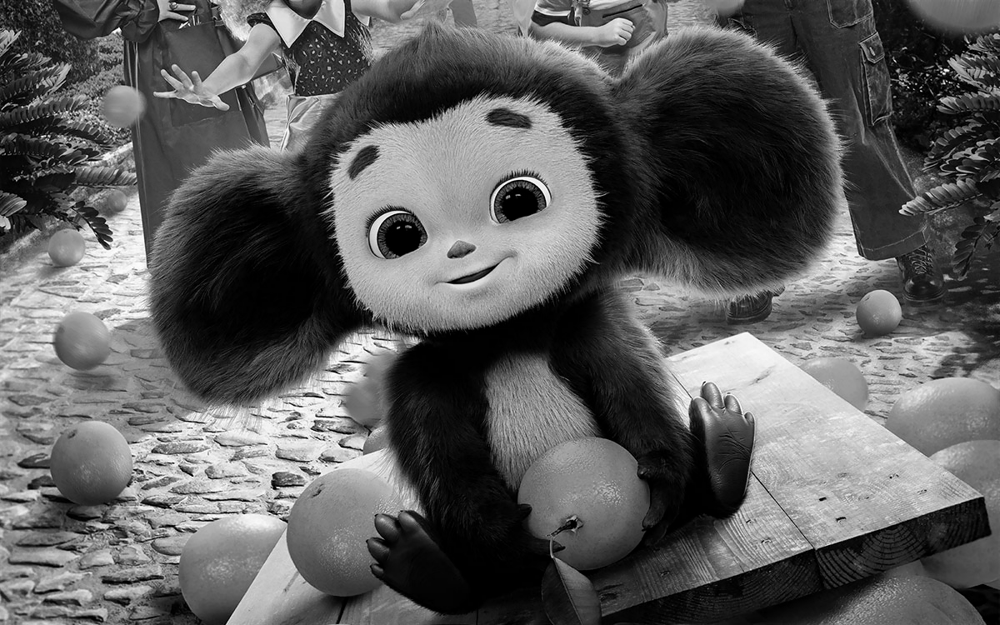


******************************************************************************************
Total time CPU:  47.23961281776428
Total time GPU:  0.029285907745361328
Acceleration (blur =  10 d =  2 ):  1613.0492941693667
******************************************************************************************

CPU processing with parameters: 
blur =  10 
d =  3
Processed image from CPU:



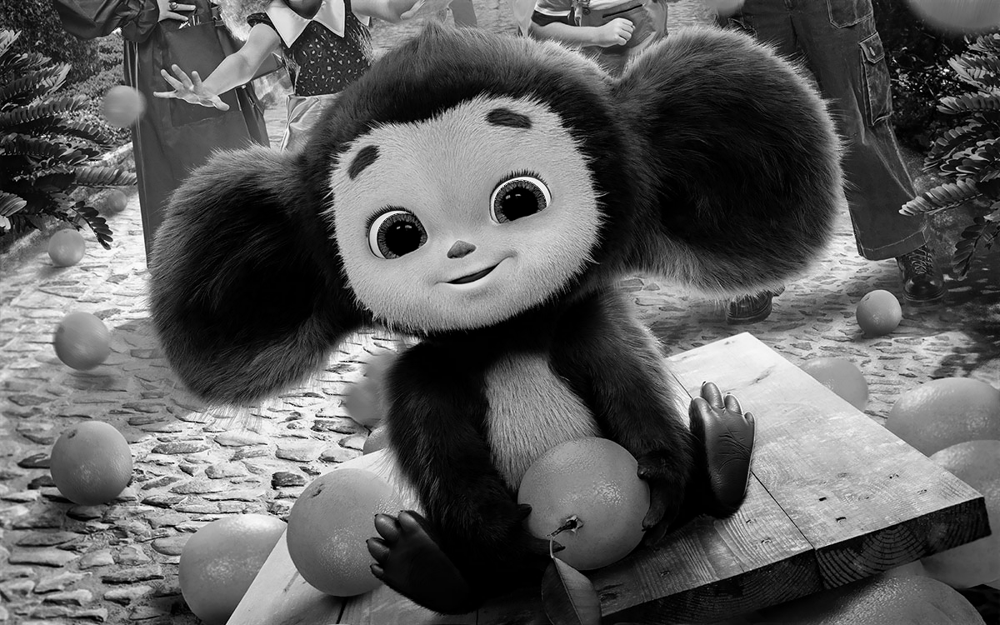

GPU processing with parameters: 
blur =  10 
d =  3
Processed image from GPU:



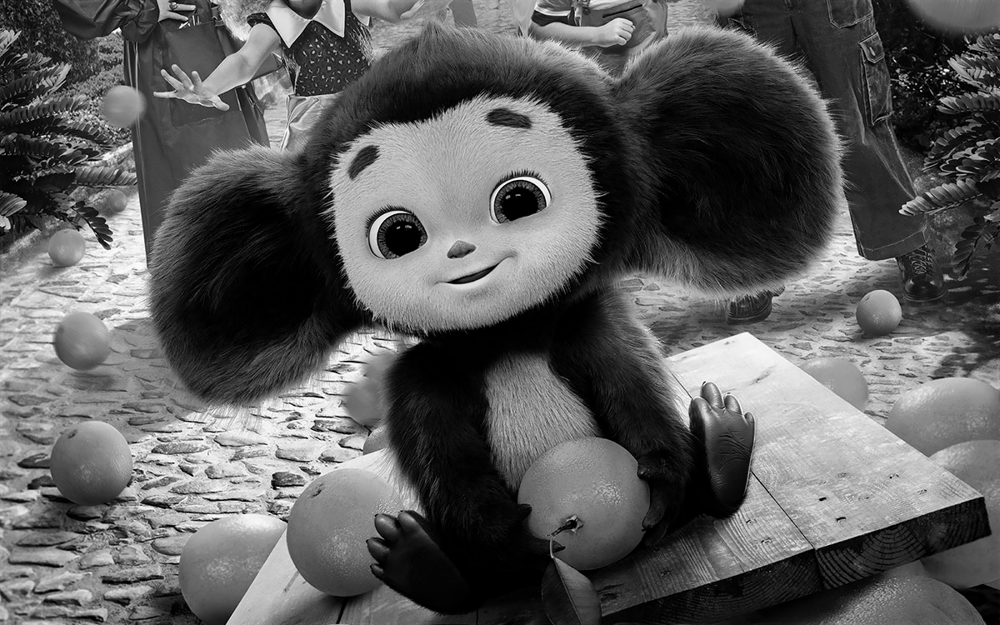


******************************************************************************************
Total time CPU:  93.09849405288696
Total time GPU:  0.039404869079589844
Acceleration (blur =  10 d =  3 ):  2362.6139669401487
******************************************************************************************

CPU processing with parameters: 
blur =  125 
d =  1
Processed image from CPU:



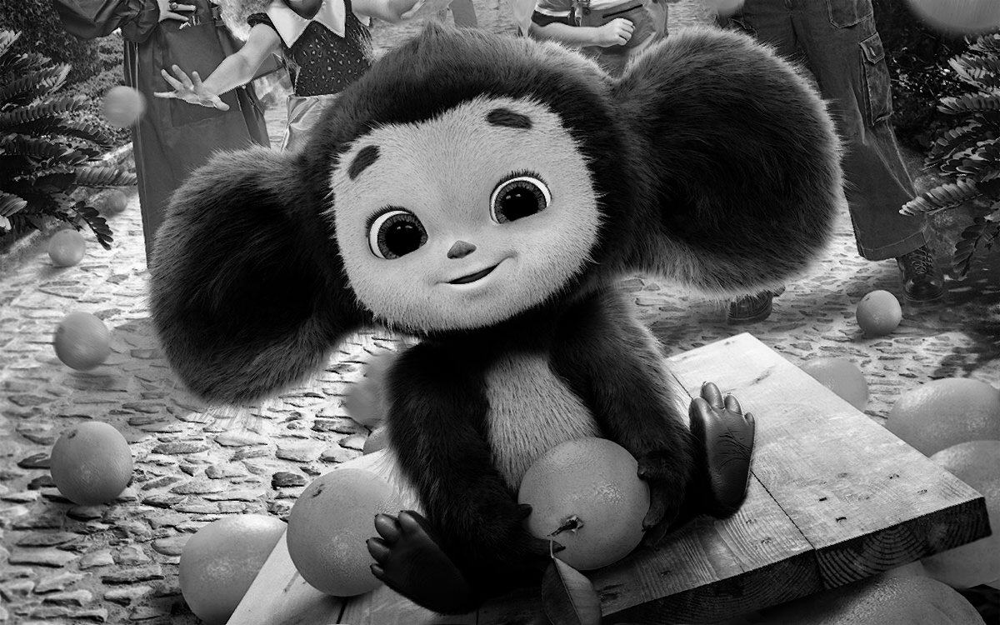

GPU processing with parameters: 
blur =  125 
d =  1
Processed image from GPU:



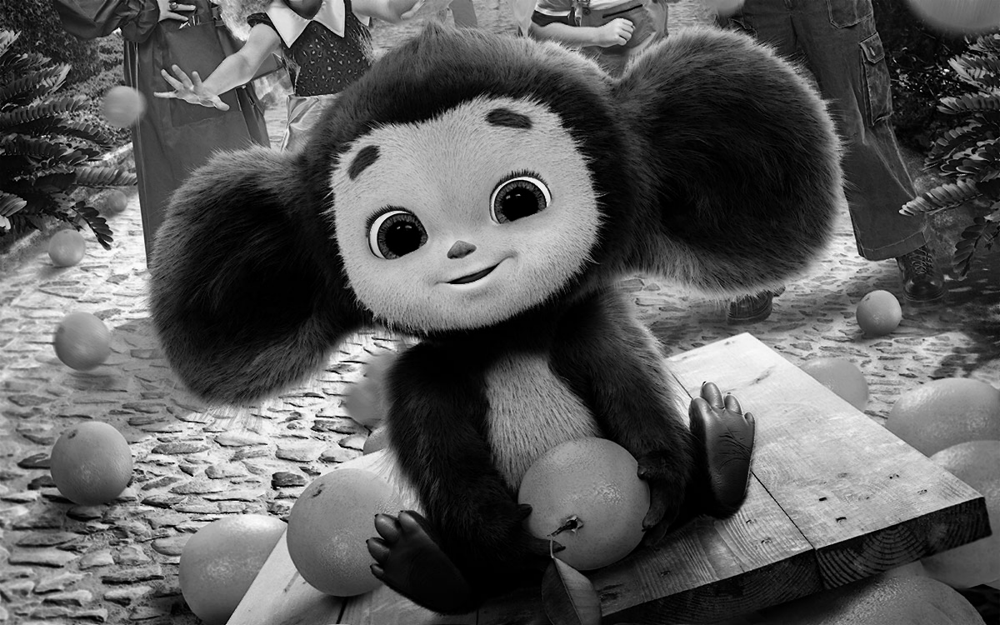


******************************************************************************************
Total time CPU:  13.582420587539673
Total time GPU:  0.021218538284301758
Acceleration (blur =  125 d =  1 ):  640.1204647347663
******************************************************************************************

CPU processing with parameters: 
blur =  125 
d =  2
Processed image from CPU:



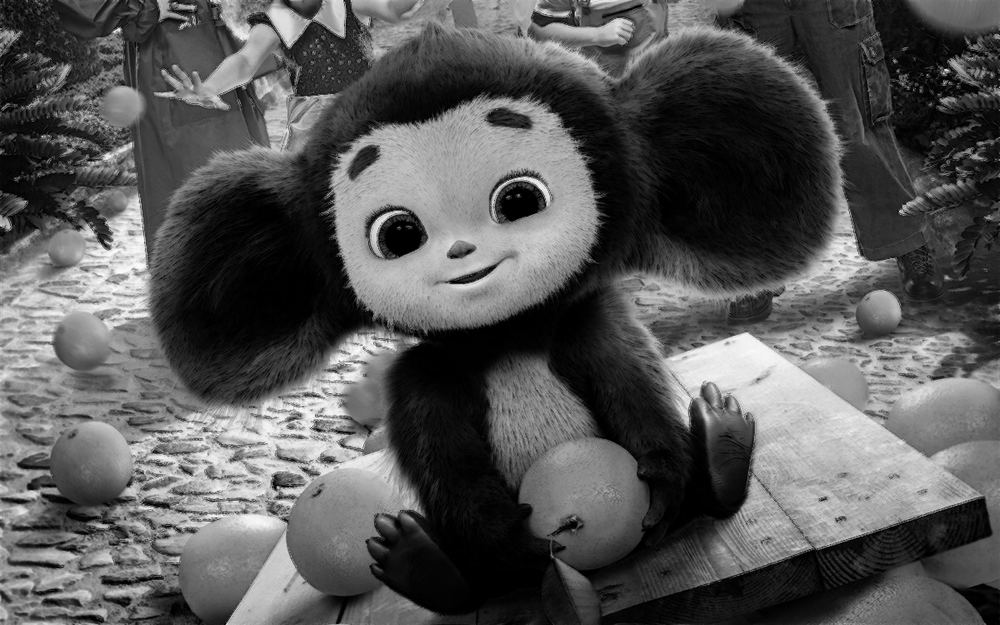

GPU processing with parameters: 
blur =  125 
d =  2
Processed image from GPU:



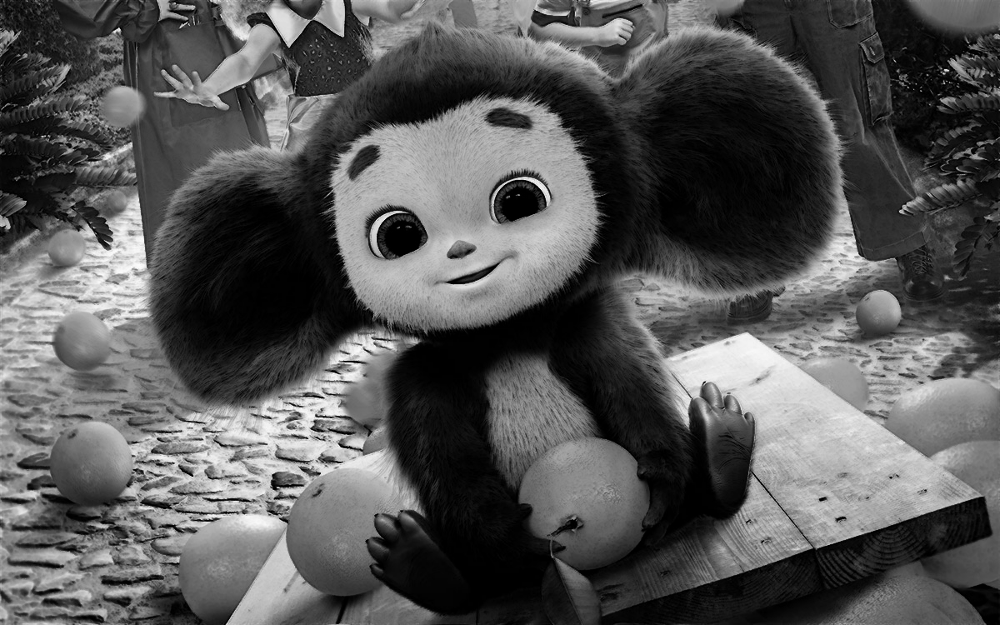


******************************************************************************************
Total time CPU:  45.23373556137085
Total time GPU:  0.026594161987304688
Acceleration (blur =  125 d =  2 ):  1700.8896758229937
******************************************************************************************

CPU processing with parameters: 
blur =  125 
d =  3
Processed image from CPU:



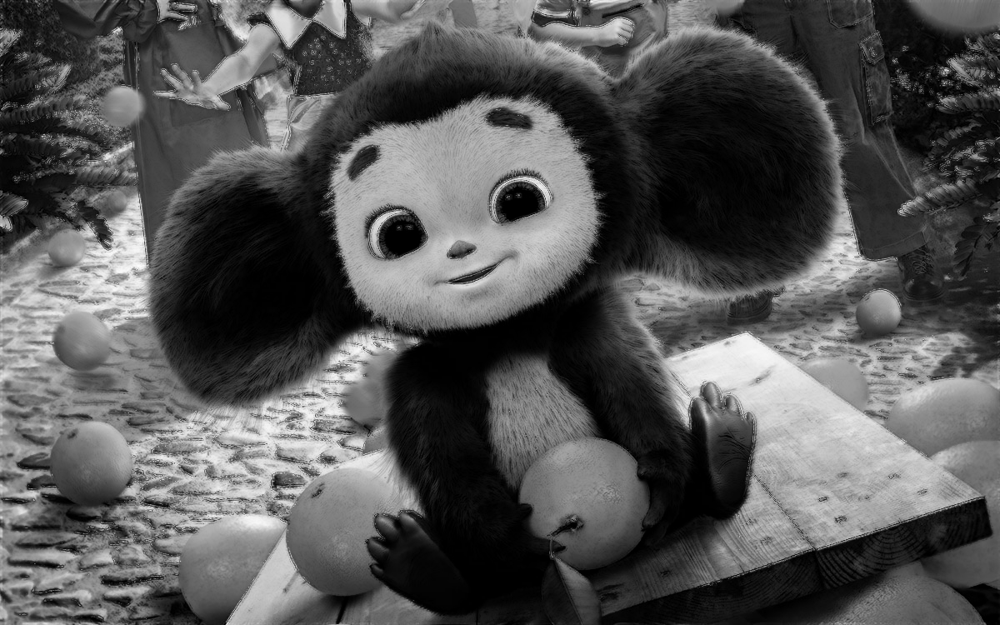

GPU processing with parameters: 
blur =  125 
d =  3
Processed image from GPU:



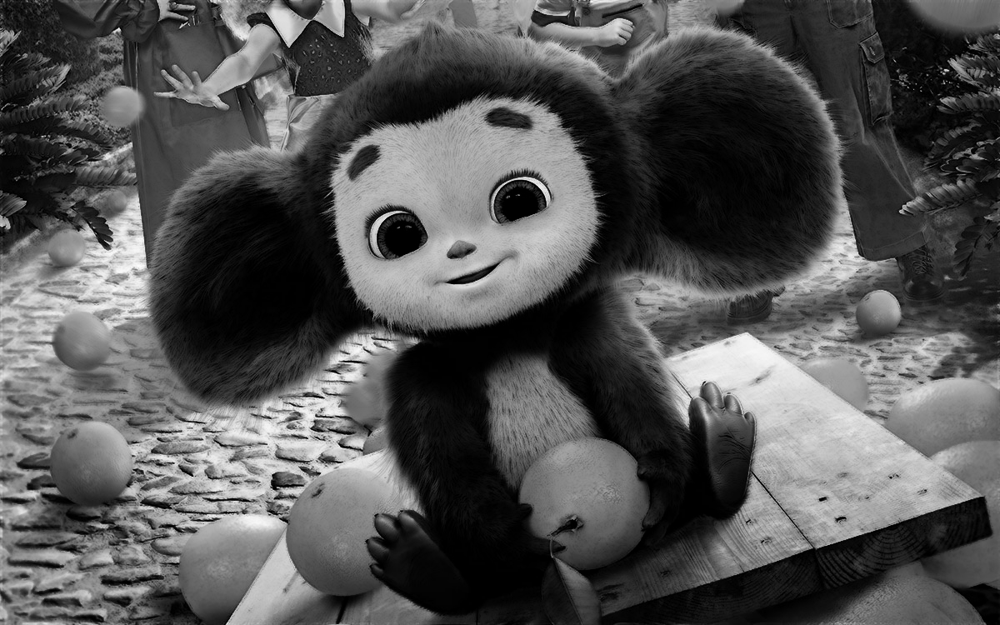


******************************************************************************************
Total time CPU:  95.13830614089966
Total time GPU:  0.028243064880371094
Acceleration (blur =  125 d =  3 ):  3368.5546007091
******************************************************************************************

CPU processing with parameters: 
blur =  255 
d =  1
Processed image from CPU:



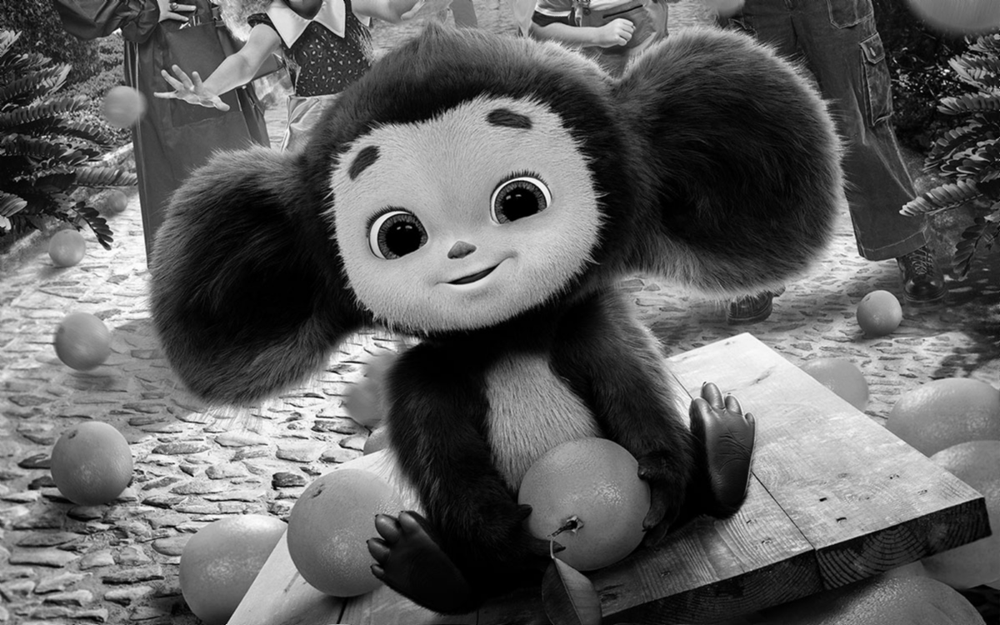

GPU processing with parameters: 
blur =  255 
d =  1
Processed image from GPU:



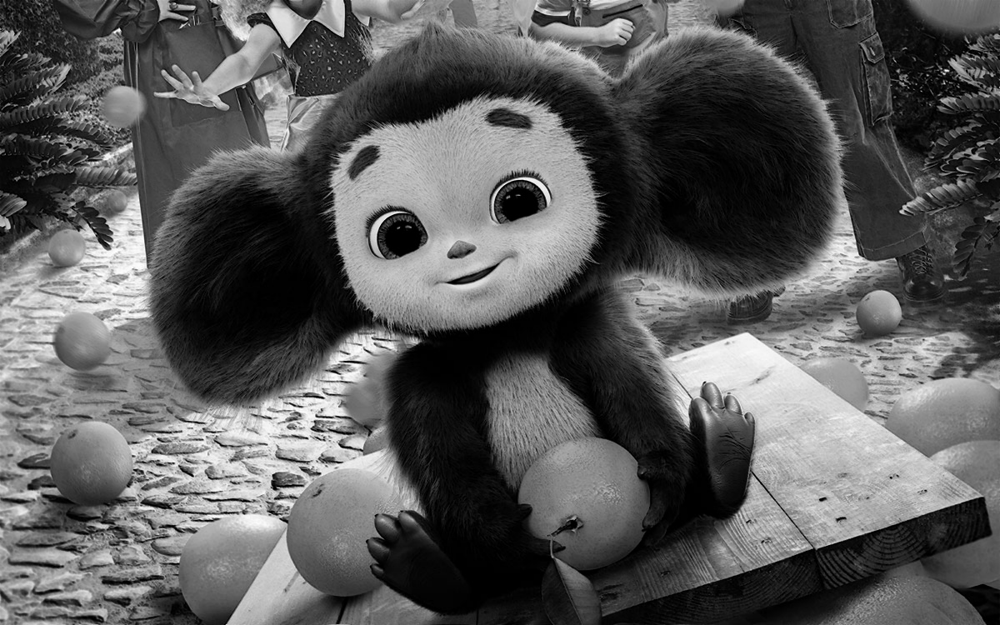


******************************************************************************************
Total time CPU:  16.323751211166382
Total time GPU:  0.019095182418823242
Acceleration (blur =  255 d =  1 ):  854.8622816546178
******************************************************************************************

CPU processing with parameters: 
blur =  255 
d =  2
Processed image from CPU:



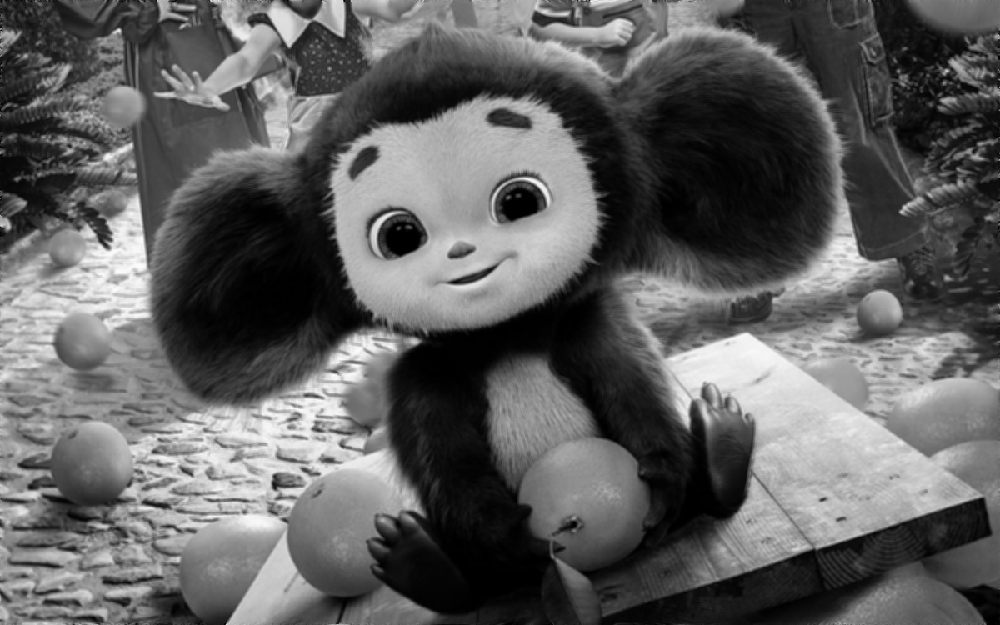

GPU processing with parameters: 
blur =  255 
d =  2
Processed image from GPU:



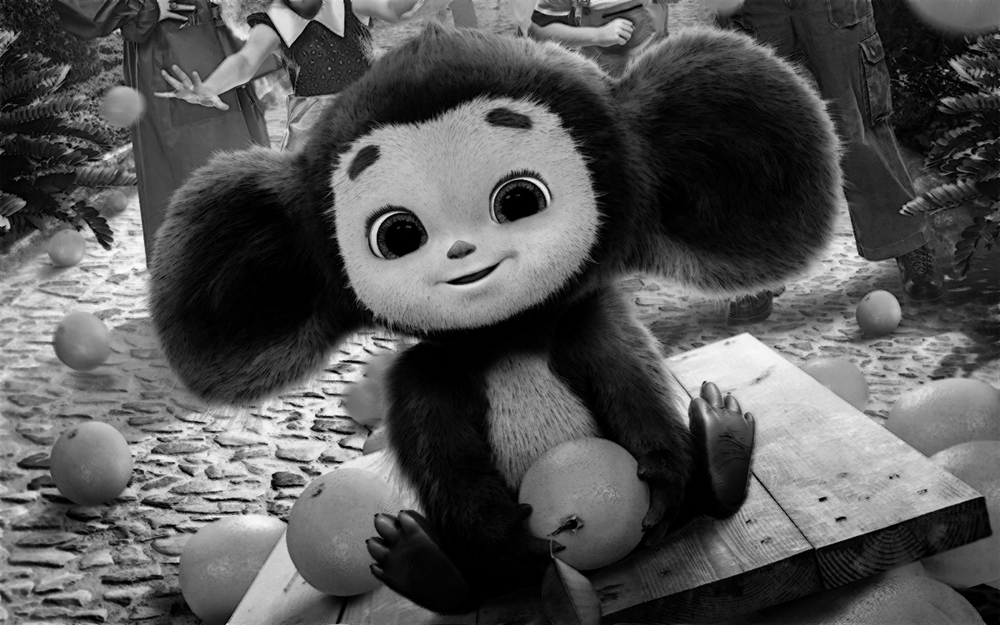


******************************************************************************************
Total time CPU:  46.73249554634094
Total time GPU:  0.031157493591308594
Acceleration (blur =  255 d =  2 ):  1499.8798093110097
******************************************************************************************

CPU processing with parameters: 
blur =  255 
d =  3
Processed image from CPU:



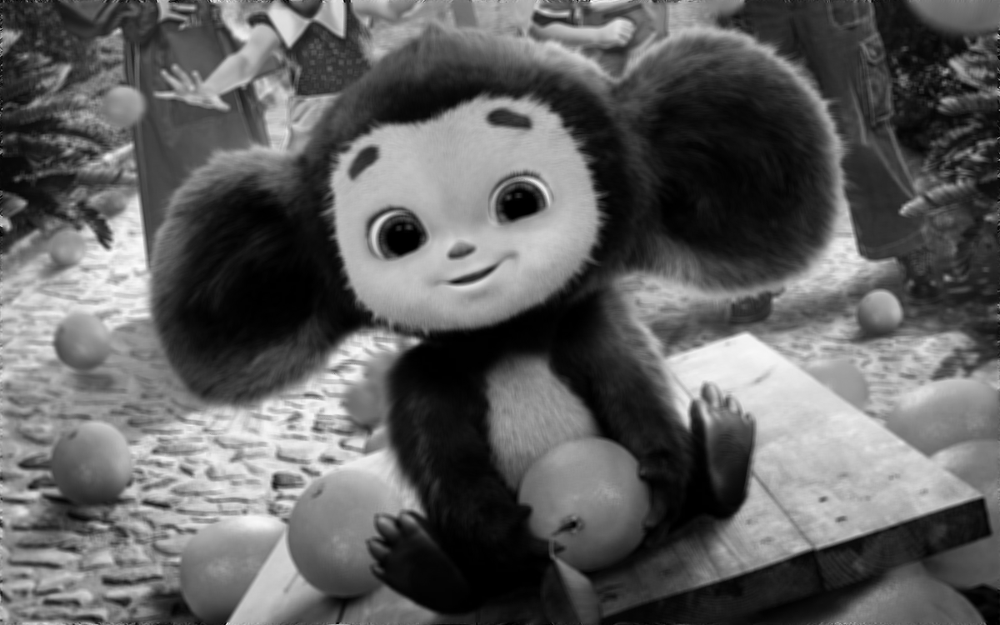

GPU processing with parameters: 
blur =  255 
d =  3
Processed image from GPU:



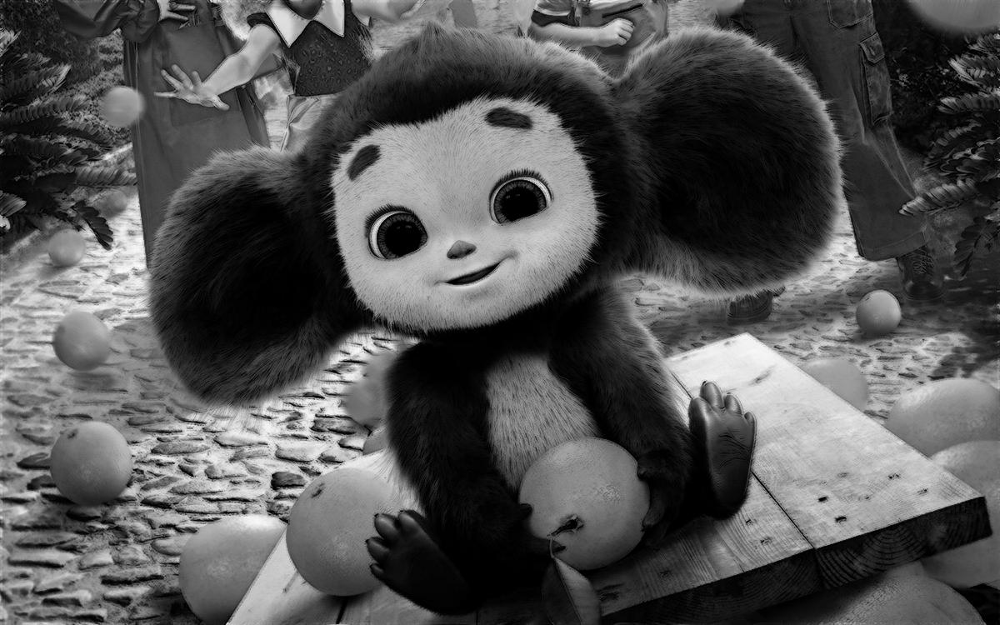


******************************************************************************************
Total time CPU:  100.07925796508789
Total time GPU:  0.026634931564331055
Acceleration (blur =  255 d =  3 ):  3757.4437810499935
******************************************************************************************



In [13]:
blur = [10, 125, 255]
d = [1, 2, 3]

for i in blur:
  for j in d:
    print("CPU processing with parameters: \nblur = ", i, "\nd = ", j)
    start_time_CPU = time.time()
    result_cpu = np.array(CPU_bilateral(img, i, j))
    result_time_CPU = time.time() - start_time_CPU

    print("Processed image from CPU:\n")
    cv2_imshow(result_cpu)

    print("GPU processing with parameters: \nblur = ", i, "\nd = ", j)
    start_time_GPU = time.time()
    result_gpu = np.array(perform_GPU(img, i, j))
    result_time_GPU = time.time() - start_time_GPU

    print("Processed image from GPU:\n")
    cv2_imshow(result_gpu)

    print("\n******************************************************************************************")
    print("Total time CPU: ", result_time_CPU)
    print("Total time GPU: ", result_time_GPU)
    print("Acceleration (blur = ", i, "d = ", j, "): ", result_time_CPU / result_time_GPU)
    print("******************************************************************************************\n")